# Regresión Lineal

In [1]:
import numpy as np
import pandas as pd
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score

# Plotting
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

## Datos

Ejemplo tomado de [acá](https://scikit-learn.org/stable/auto_examples/linear_model/plot_ols.html#sphx-glr-auto-examples-linear-model-plot-ols-py) (basado en edición previa de la Diplomatura de Datos).

Busquemos un conjunto de datos...

In [2]:
# Load the diabetes dataset
diabetes = datasets.load_diabetes()

# Use only one feature
diabetes_X = diabetes.data[:, np.newaxis, 2] # Body mass index

In [3]:
#print(diabetes)
type(diabetes)

sklearn.utils._bunch.Bunch

In [4]:
dir(diabetes)

['DESCR',
 'data',
 'data_filename',
 'data_module',
 'feature_names',
 'frame',
 'target',
 'target_filename']

In [5]:
print(diabetes.feature_names)

['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6']


In [6]:
print(diabetes['DESCR'])

.. _diabetes_dataset:

Diabetes dataset
----------------

Ten baseline variables, age, sex, body mass index, average blood
pressure, and six blood serum measurements were obtained for each of n =
442 diabetes patients, as well as the response of interest, a
quantitative measure of disease progression one year after baseline.

**Data Set Characteristics:**

:Number of Instances: 442

:Number of Attributes: First 10 columns are numeric predictive values

:Target: Column 11 is a quantitative measure of disease progression one year after baseline

:Attribute Information:
    - age     age in years
    - sex
    - bmi     body mass index
    - bp      average blood pressure
    - s1      tc, total serum cholesterol
    - s2      ldl, low-density lipoproteins
    - s3      hdl, high-density lipoproteins
    - s4      tch, total cholesterol / HDL
    - s5      ltg, possibly log of serum triglycerides level
    - s6      glu, blood sugar level

Note: Each of these 10 feature variables have bee

Dividimos los datos

In [7]:
# Split the data into training/testing sets
diabetes_X_train = diabetes_X[:-20]
diabetes_X_test = diabetes_X[-20:]

# Split the targets into training/testing sets
diabetes_y_train = diabetes.target[:-20]
diabetes_y_test = diabetes.target[-20:]

In [13]:
diabetes.target.shape

(442,)

Exploremos un poco lo que hemos hecho

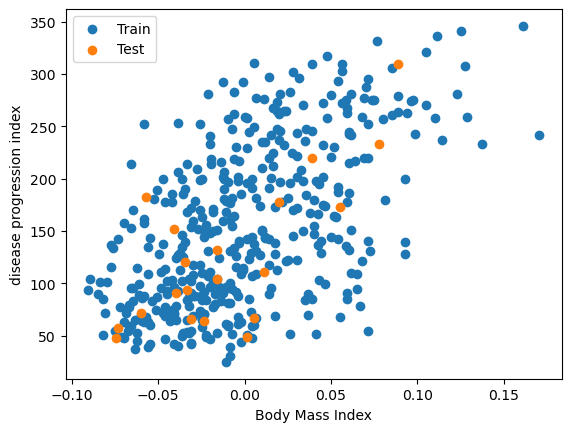

In [14]:
plt.figure()
plt.scatter(diabetes_X_train, diabetes_y_train, label="Train")
plt.scatter(diabetes_X_test, diabetes_y_test, label="Test")
plt.legend()
plt.xlabel('Body Mass Index')
plt.ylabel('disease progression index')
plt.show()

# Regresión Lineal

## Una variable

$y = \beta_0 + \beta_1 x_1$

Creamos el objeto de la regresión lineal

In [15]:
regr = linear_model.LinearRegression()

Entrenamos el modelo utilizando el conjunto de datos de entrenamiento

In [16]:
regr.fit(diabetes_X_train, diabetes_y_train)

LinearRegression()

Para ayuda

In [17]:
#regr.fit?
help(regr.fit)

Help on method fit in module sklearn.linear_model._base:

fit(X, y, sample_weight=None) method of sklearn.linear_model._base.LinearRegression instance
    Fit linear model.

    Parameters
    ----------
    X : {array-like, sparse matrix} of shape (n_samples, n_features)
        Training data.

    y : array-like of shape (n_samples,) or (n_samples, n_targets)
        Target values. Will be cast to X's dtype if necessary.

    sample_weight : array-like of shape (n_samples,), default=None
        Individual weights for each sample.

        .. versionadded:: 0.17
           parameter *sample_weight* support to LinearRegression.

    Returns
    -------
    self : object
        Fitted Estimator.



Hacemos predicciones utilizando el conjunto de datos de prueba
https://scikit-learn.org/stable/

In [18]:
diabetes_y_pred = regr.predict(diabetes_X_test)

Coefficients: 938.24
Intercept: 152.92
Mean squared error: 2548.07
Variance score: 0.47


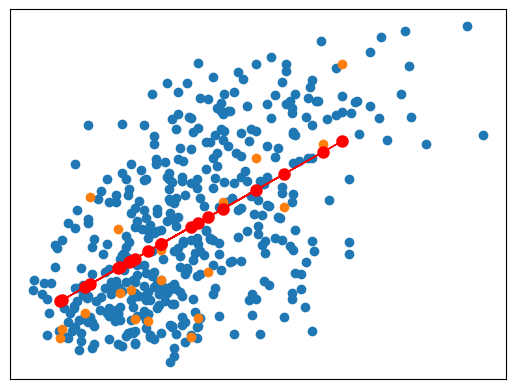

In [19]:
# The coefficients
print('Coefficients: {:.2f}'.format(regr.coef_[0]))
print(f'Intercept: {regr.intercept_:.2f}')
# The mean squared error
print("Mean squared error: %.2f"
      % mean_squared_error(diabetes_y_test, diabetes_y_pred))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(diabetes_y_test, diabetes_y_pred))

# Plot outputs
plt.scatter(diabetes_X_train, diabetes_y_train)
plt.scatter(diabetes_X_test, diabetes_y_test)
plt.plot(diabetes_X_test, diabetes_y_pred,'-', color='red', linewidth=1)
plt.scatter(diabetes_X_test, diabetes_y_pred, color='red', linewidth=3)

plt.xticks(())
plt.yticks(())

plt.show()

# Y las demás variables?

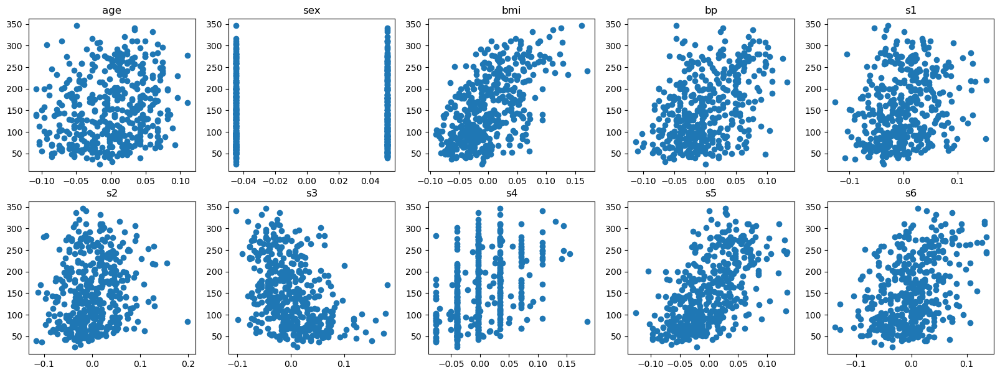

In [20]:
plt.figure(figsize=(20,7))
i=0
for var, name in zip(diabetes.data.T, diabetes.feature_names):
    i+=1
    plt.subplot(2,5,i)
    plt.scatter(var,diabetes.target)
    plt.title(name)

# Dos variables

$y = \beta_0 + \beta_1 x_1 + \beta_2 x_2$

In [21]:
diabetes_X2 = diabetes.data[:, [2,8]] # bmi and s5
# Split the data into training/testing sets
diabetes_X_train2 = diabetes_X2[:-20]
diabetes_X_test2 = diabetes_X2[-20:]

In [22]:
regr2 = linear_model.LinearRegression()

In [23]:
regr2.fit(diabetes_X_train2, diabetes_y_train)

LinearRegression()

In [24]:
diabetes_y_pred2 = regr2.predict(diabetes_X_test2)

In [25]:
# The coefficients
print('Coefficients: \n', regr2.coef_)
print(f'Intercept: {regr2.intercept_:.2f}')
# The mean squared error
print("Mean squared error: %.2f"
      % mean_squared_error(diabetes_y_test, diabetes_y_pred2))
# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(diabetes_y_test, diabetes_y_pred2))

Coefficients: 
 [669.65259645 609.7326832 ]
Intercept: 152.95
Mean squared error: 1984.49
Variance score: 0.59


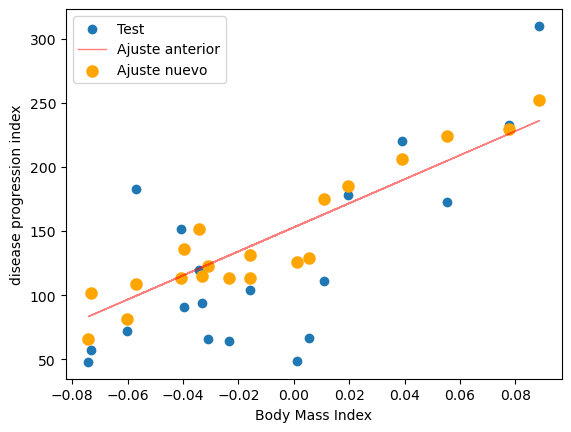

In [26]:
# Plot outputs
#plt.scatter(diabetes_X_train2[:,0], diabetes_y_train, label="Train")
plt.scatter(diabetes_X_test2[:,0], diabetes_y_test, label = "Test")
plt.plot(diabetes_X_test, diabetes_y_pred,'-',
    color='red', linewidth=1, alpha=0.5, label="Ajuste anterior")
plt.scatter(diabetes_X_test2[:,0], diabetes_y_pred2,
     color='orange', linewidth=3, label="Ajuste nuevo")

plt.xlabel('Body Mass Index')
plt.ylabel('disease progression index')
plt.legend()
plt.show()

## Veamos en gráficos 3D que está sucediendo

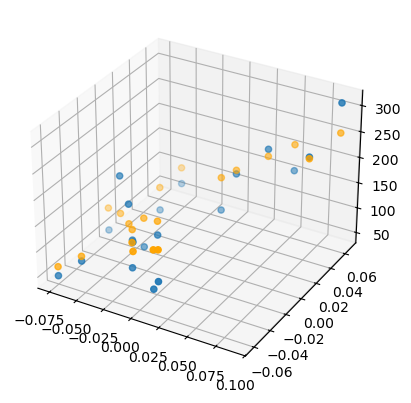

In [27]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
#ax.scatter(*diabetes_X_train2.T, diabetes_y_train,alpha=0.1)
ax.scatter(*diabetes_X_test2.T, diabetes_y_test)
ax.scatter(*diabetes_X_test2.T, diabetes_y_pred2,c='orange')
plt.show()

Veamos en forma interactiva como se ve con plotly:

In [28]:
df = pd.DataFrame(diabetes_X_test2)
df['target'] = diabetes_y_test
df['pred1'] = diabetes_y_pred
df['pred2'] = diabetes_y_pred2

fig1 = px.scatter_3d(df, x=0, y=1 , z='target',
                     color_discrete_sequence=['blue' for i in df.target], 
                     size=[0.1 for i in df.target])
fig2 = px.scatter_3d(df, x=0, y=1 , z='pred1',
                     color_discrete_sequence=['red' for i in df.target], 
                     size=[0.1 for i in df.target])
fig3 = px.scatter_3d(df, x=0, y=1 , z='pred2',
                     color_discrete_sequence=['orange'for i in df.target], 
                     size=[0.1 for i in df.target])
fig4 = go.Figure(data=fig1.data+fig2.data+fig3.data)
fig4.show()

## Referencias

 * [Diabetes Dataset](https://scikit-learn.org/stable/datasets/toy_dataset.html#diabetes-dataset)
 * [Plotly](https://plotly.com/python/)